In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_recall_curve, auc
from PIL import Image
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from torch import nn


import torch.hub
import yaml
import os
import shutil
import cv2
import torch
import random
import numpy as np
import matplotlib.pyplot as plt
import subprocess
import seaborn as sns
import torch
import xml.etree.ElementTree as ET


In [3]:
# Reading image and label files

# paths to the actual image and label directories
images_path = '/kaggle/input/project-ai/extracted_frames_zip/extracted_frames_zip/'
labels_path = '/kaggle/input/project-ai/Annotation_01/Annotation_01/'

# List files for 10 images and labels
print("Images:", os.listdir(images_path)[:10]) 
print("Labels:", os.listdir(labels_path)[:10]) 

images = [f for f in os.listdir(images_path) if f.endswith('.jpg')]
labels = [f for f in os.listdir(labels_path) if f.endswith('.xml')]

image_names = [os.path.splitext(f)[0] for f in images]
label_names = [os.path.splitext(f)[0] for f in labels]

# Check common names
common_names = list(set(image_names).intersection(set(label_names)))
print(f"Common names count: {len(common_names)}")
if len(common_names) == 0:
    print("No matching images and labels found. Check file names.")




Images: ['IMG_0060_frame_1080.jpg', 'dominate_female_with_cubs_frame_480.jpg', 'IMG_0070_frame_0.jpg', 'IMG_0033_frame_180.jpg', 'IMG_0003_frame_1800.jpg', 'IMG_0046_frame_720.jpg', 'IMG_0014_frame_1380.jpg', 'IMAG0030_frame_660.jpg', 'IMG_0054_frame_240.jpg', 'IMG_0017_frame_480.jpg']
Labels: ['IMG_0045_frame_1680.xml', 'IMG_0014_frame_1560.xml', 'mum_with_cub_frame_3420.xml', 'boar_sow_with_cubs_frame_720.xml', 'IMG_0018_frame_240.xml', 'mum_with_cub_frame_3240.xml', 'IMG_0003_frame_4740.xml', 'IMG_0032_frame_3240.xml', 'mum_with_cub_frame_3300.xml', 'IMG_0003 (2)_frame_1080.xml']
Common names count: 841


In [4]:

# train/test split
train_names, val_names = train_test_split(common_names, test_size=0.2, random_state=42)

def copy_files(names, src_images, src_labels, dest_images, dest_labels):
    os.makedirs(dest_images, exist_ok=True)
    os.makedirs(dest_labels, exist_ok=True)
    for name in names:
        shutil.copy(os.path.join(src_images, name + '.jpg'), os.path.join(dest_images, name + '.jpg'))
        shutil.copy(os.path.join(src_labels, name + '.xml'), os.path.join(dest_labels, name + '.xml'))

# Copy files to train/val directories
copy_files(train_names, images_path, labels_path, 'dataset/images/train', 'dataset/labels/train')
copy_files(val_names, images_path, labels_path, 'dataset/images/val', 'dataset/labels/val')




In [5]:

# Extracting Unique Classes

labels_path = '/kaggle/input/project-ai/Annotation_01/Annotation_01/'
classes = set()

# Parse XML files to extract unique class names
for xml_file in os.listdir(labels_path):
    if xml_file.endswith('.xml'):
        tree = ET.parse(os.path.join(labels_path, xml_file))
        root = tree.getroot()
        for obj in root.iter('object'):
            cls_name = obj.find('name').text
            classes.add(cls_name)

# Write unique class names to a file
with open('classes.txt', 'w') as f:
    for cls in sorted(classes):
        f.write(f"{cls}\n")

print(f"Found {len(classes)} unique classes.")



Found 107 unique classes.


In [6]:

# YAML Configuration File 
# Load the unique classes from the file
with open('classes.txt') as f:
    unique_classes = [line.strip() for line in f.readlines()]

# Create the badger.yaml configuration file
yaml_content = f"""
train: /kaggle/working/dataset/images/train
val: /kaggle/working/dataset/images/val

nc: {len(unique_classes)}  # number of classes
names: {unique_classes}
"""

with open('/kaggle/working/badger.yaml', 'w') as file:
    file.write(yaml_content)

In [7]:

# Initial hyperparameters settings


# hyperparameters including augmentation fields
initial_hyp = {
    'lr0': 0.02,  # initial learning rate
    'lrf': 0.01,   # final OneCycleLR learning rate
    'momentum': 0.937,  # SGD momentum
    'weight_decay': 0.0005,  # optimizer weight decay
    'warmup_epochs': 3.0,  # warmup epochs
    'warmup_momentum': 0.8,  # warmup initial momentum
    'warmup_bias_lr': 0.1,  # warmup initial bias lr
    'box': 0.05,  # box loss gain
    'cls': 0.5,  # cls loss gain
    'cls_pw': 1.0,  # cls BCELoss positive_weight
    'obj': 1.0,  # obj loss gain
    'obj_pw': 1.0,  # obj BCELoss positive_weight
    'iou_t': 0.20,  # IoU training threshold
    'anchor_t': 4.0,  # anchor-multiple threshold
    'fl_gamma': 0.0,  # focal loss gamma
    'mosaic': 0.0,  # probability of mosaic augmentation
#     'mixup': 0.5,  # probability mixup augmentation
    'degrees': 0.0,  # maximum rotation for augmentation
    'translate': 0.0,  # translate ratio for augmentation
    'scale': 0.0,  # scale ratio for augmentation
    'shear': 0.0,  # shear ratio for augmentation
    'perspective': 0.0,  # perspective ratio for augmentation
    'flipud': 0.0,  # probability of flipping image upside down
    'fliplr': 0.0,  # probability of flipping image left to right
    'copy_paste' : 0.0,
    'hsv_h': 0.01,  # hue adjust in HSV space
    'hsv_s': 0.3,  # saturation adjust in HSV space
    'hsv_v': 0.3,  # value adjust in HSV space
}

#hyperparameters to 'hyp.yaml'
with open('/kaggle/working/hyp.yaml', 'w') as f:
    yaml.dump(initial_hyp, f)

# Verify the creation
print("Initial hyperparameters set in 'hyp.yaml':")
with open('/kaggle/working/hyp.yaml') as f:
    print(f.read())


Initial hyperparameters set in 'hyp.yaml':
anchor_t: 4.0
box: 0.05
cls: 0.5
cls_pw: 1.0
copy_paste: 0.0
degrees: 0.0
fl_gamma: 0.0
fliplr: 0.0
flipud: 0.0
hsv_h: 0.01
hsv_s: 0.3
hsv_v: 0.3
iou_t: 0.2
lr0: 0.02
lrf: 0.01
momentum: 0.937
mosaic: 0.0
obj: 1.0
obj_pw: 1.0
perspective: 0.0
scale: 0.0
shear: 0.0
translate: 0.0
warmup_bias_lr: 0.1
warmup_epochs: 3.0
warmup_momentum: 0.8
weight_decay: 0.0005



In [8]:
# After updating hyp.yaml
with open('/kaggle/working/hyp.yaml', 'r') as f:
    updated_hyp = yaml.safe_load(f)
print("Updated hyperparameters:", updated_hyp)


Updated hyperparameters: {'anchor_t': 4.0, 'box': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'copy_paste': 0.0, 'degrees': 0.0, 'fl_gamma': 0.0, 'fliplr': 0.0, 'flipud': 0.0, 'hsv_h': 0.01, 'hsv_s': 0.3, 'hsv_v': 0.3, 'iou_t': 0.2, 'lr0': 0.02, 'lrf': 0.01, 'momentum': 0.937, 'mosaic': 0.0, 'obj': 1.0, 'obj_pw': 1.0, 'perspective': 0.0, 'scale': 0.0, 'shear': 0.0, 'translate': 0.0, 'warmup_bias_lr': 0.1, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'weight_decay': 0.0005}


In [9]:

# Load the unique classes from the file
with open('classes.txt') as f:
    unique_classes = [line.strip() for line in f.readlines()]

# Generate YAML, class names
yaml_content = f"""
nc: {len(unique_classes)}  # number of classes
names: [{', '.join(f"'{name}'" for name in unique_classes)}]
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# Anchors
anchors:
  - [10, 13, 16, 30, 33, 23]

# Backbone
backbone:
  - [-1, 1, 'Focus', [64, 3]]
  - [-1, 1, 'Conv', [128, 3, 2]]
  - [-1, 3, 'C3', [128]]
  - [-1, 1, 'Conv', [256, 3, 2]]
  - [-1, 9, 'C3', [256]]
  - [-1, 1, 'Conv', [512, 3, 2]]
  - [-1, 9, 'C3', [512]]
  - [-1, 1, 'Conv', [1024, 3, 2]]
  - [-1, 1, 'SPP', [1024, [5, 9, 13]]]
  - [-1, 3, 'C3', [1024, False]]

# Head
head:
  - [-1, 1, 'Conv', [512, 1, 1]]
  - [-1, 1, 'nn.Upsample', [None, 2, 'nearest']]
  - [[-1, 6], 1, 'Concat', [1]]
  - [-1, 3, 'C3', [512, False]]
  - [-1, 1, 'Conv', [256, 1, 1]]
  - [-1, 1, 'nn.Upsample', [None, 2, 'nearest']]
  - [[-1, 4], 1, 'Concat', [1]]
  - [-1, 3, 'C3', [256, False]]
  - [-1, 1, 'Conv', [256, 3, 2]]
  - [[-1, 14], 1, 'Concat', [1]]
  - [-1, 3, 'C3', [512, False]]
  - [-1, 1, 'Conv', [512, 3, 2]]
  - [[-1, 10], 1, 'Concat', [1]]
  - [-1, 3, 'C3', [1024, False]]
  - [-1, 1, 'Detect', [nc, anchors]]
"""

# Write the YAML content to a file
yaml_file_path = '/kaggle/working/custom_yolov5s.yaml'
with open(yaml_file_path, 'w') as file:
    file.write(yaml_content)
print(f"YAML configuration saved to {yaml_file_path}")

# Validate the YAML
with open(yaml_file_path, 'r') as file:
    try:
        yaml_data = yaml.safe_load(file)
        print("YAML is valid.")
        print(yaml_data)
    except yaml.YAMLError as exc:
        print("Error in YAML file:", exc)


YAML configuration saved to /kaggle/working/custom_yolov5s.yaml
YAML is valid.
{'nc': 107, 'names': ['Badger_10', 'Badger_10_BodySize_Small', 'Badger_10_BodySize_large', 'Badger_10_Leg_Black', 'Badger_10_Tail_Long', 'Badger_11_BodySize_Large', 'Badger_11_Face_Larger_Stripes', 'Badger_11_Face_Longer_Stripe', 'Badger_12_BodySize_Large', 'Badger_12_Face_Narrow_Stripe', 'Badger_13', 'Badger_13_BodySize_Large', 'Badger_13_BodySize_Medium', 'Badger_13_BodySize_large', 'Badger_13_Fur_Brown_Grey', 'Badger_14', 'Badger_14_BodySize_Small', 'Badger_14_Face_Stripe', 'Badger_14_Face_Strips', 'Badger_14_Fur_Brown_Grey', 'Badger_14_Tail_Grey', 'Badger_15_BodySize_Large', 'Badger_15_Ear_White_Black', 'Badger_16_BodySize_Medium', 'Badger_17_BodySize_Small', 'Badger_17_Face_Small_Stripe', 'Badger_17_Face_Strip', 'Badger_17_Fur_Brown_Grey', 'Badger_18_BodySize_Large', 'Badger_18_Ear_Notches', 'Badger_19_BodySize_Large', 'Badger_19_Tail_Long', 'Badger_1_BodySize_Large', 'Badger_1_Face_Stripes', 'Badger_1_

In [10]:
# Converting Annotations
# Load class names
with open('classes.txt') as f:
    classes = [line.strip() for line in f.readlines()]

# Map class names to indices
class_to_idx = {cls: idx for idx, cls in enumerate(classes)}

def convert(size, box):
    dw = 1. / size[0]
    dh = 1. / size[1]
    x = (box[0] + box[1]) / 2.0
    y = (box[2] + box[3]) / 2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    return (x * dw, y * dh, w * dw, h * dh)

def is_within_bounds(box, width, height):
    # bounding box does not exceed the image dimensions
    xmin, xmax, ymin, ymax = box
    if xmin < 0 or xmax > width or ymin < 0 or ymax > height:
        return False
    if xmax <= xmin or ymax <= ymin:
        return False
    return True

def convert_annotation(xml_file, txt_file):
    try:
        tree = ET.parse(xml_file)
        root = tree.getroot()
        size = root.find('size')
        w = int(size.find('width').text)
        h = int(size.find('height').text)
        
        with open(txt_file, 'w') as out_file:
            for obj in root.iter('object'):
                cls_name = obj.find('name').text
                if cls_name in class_to_idx:
                    cls_id = class_to_idx[cls_name]
                    xmlbox = obj.find('bndbox')
                    b = (float(xmlbox.find('xmin').text), float(xmlbox.find('xmax').text),
                         float(xmlbox.find('ymin').text), float(xmlbox.find('ymax').text))
                    if not is_within_bounds(b, w, h):
                        print(f"Warning: Box {b} in file {xml_file} is out of bounds.")
                        continue
                    bb = convert((w, h), b)
                    out_file.write(f"{cls_id} {' '.join(map(str, bb))}\n")
    except Exception as e:
        print(f"Error processing file {xml_file}: {e}")

# Convert annotations for both train and val sets
for phase in ['train', 'val']:
    xml_dir = f'/kaggle/working/dataset/labels/{phase}'
    txt_dir = f'/kaggle/working/dataset/labels_yolo/{phase}'
    os.makedirs(txt_dir, exist_ok=True)
    for xml_file in os.listdir(xml_dir):
        if xml_file.endswith('.xml'):
            convert_annotation(os.path.join(xml_dir, xml_file), os.path.join(txt_dir, xml_file.replace('.xml', '.txt')))

In [11]:
# Checking Labels

def check_labels(path, num_files=5):
    from os import listdir
    from os.path import isfile, join
    files = [f for f in listdir(path) if isfile(join(path, f)) and f.endswith('.txt')]
    for f in files[:num_files]:
        print(f'Contents of {f}:')
        with open(join(path, f), 'r') as file:
            contents = file.read()
            print(contents)
            if contents.strip() == '':
                print("Warning: Empty label file!")

check_labels('/kaggle/working/dataset/labels_yolo/train/')

Contents of IMG_0056_frame_1320.txt:
98 0.9143229166666667 0.6199074074074075 0.17135416666666667 0.7268518518518519

Contents of dominate_female_with_cubs_frame_480.txt:
80 0.93203125 0.41111111111111115 0.1359375 0.4203703703703704
78 0.93515625 0.17175925925925928 0.09635416666666667 0.04351851851851852
87 0.8260416666666667 0.4444444444444445 0.06458333333333333 0.13518518518518519
88 0.6877604166666667 0.5796296296296296 0.12343749999999999 0.1574074074074074
85 0.73046875 0.5314814814814816 0.2661458333333333 0.3092592592592593

Contents of IMG_0003_frame_5040.txt:
7 0.63046875 0.38796296296296295 0.1140625 0.19444444444444445

Contents of mum_with_cub_frame_3780.txt:
88 0.4083333333333333 0.3050925925925926 0.16354166666666667 0.1564814814814815

Contents of badger_mum_with_2_cubs_1_frame_900.txt:
63 0.4263020833333333 0.4222222222222222 0.0765625 0.0925925925925926
65 0.3765625 0.5291666666666667 0.03854166666666667 0.0787037037037037
64 0.3502604166666667 0.4615740740740741 0.

In [12]:
# Helper function to draw bounding boxes
def draw_bounding_box(image, bbox, label, color=(255, 0, 0)):
    xmin, ymin, xmax, ymax = bbox
    cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)
    cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)



In [13]:
import os
import cv2
import xml.etree.ElementTree as ET
import json
import matplotlib.pyplot as plt

# extract and save keypoints using SIFT
def extract_and_save_keypoints_sift(image_path, annotation_path, output_dir):
    # Load image
    image = cv2.imread(image_path)
    
    # Parse XML annotation
    tree = ET.parse(annotation_path)
    root = tree.getroot()
    image_keypoints = {}
    
    for obj in root.iter('object'):
        cls_name = obj.find('name').text
        xmlbox = obj.find('bndbox')
        xmin = int(xmlbox.find('xmin').text)
        ymin = int(xmlbox.find('ymin').text)
        xmax = int(xmlbox.find('xmax').text)
        ymax = int(xmlbox.find('ymax').text)
        
        # Extract region 
        roi = image[ymin:ymax, xmin:xmax]
        
        # Keypoint detection 
        sift = cv2.SIFT_create()
        keypoints, descriptors = sift.detectAndCompute(roi, None)
        
        # Convert keypoints to a list of tuples
        keypoints_list = [(kp.pt[0] + xmin, kp.pt[1] + ymin, kp.size, kp.angle, kp.response, kp.octave, kp.class_id) for kp in keypoints]
        descriptors_list = descriptors.tolist() if descriptors is not None else []

        image_keypoints[cls_name] = {
            'keypoints': keypoints_list,
            'descriptors': descriptors_list
        }
    
    # Save keypoints and descriptors to JSON file
    image_id = os.path.splitext(os.path.basename(image_path))[0]
    output_file = os.path.join(output_dir, f"{image_id}_keypoints.json")
    with open(output_file, 'w') as f:
        json.dump(image_keypoints, f)
#     print(f"Saved keypoints to {output_file}")




In [14]:
# draw keypoints and bounding boxes on image
def draw_keypoints_and_bounding_boxes(image_path, annotation_path, keypoints_data):
    # Load image
    image = cv2.imread(image_path)
    
    # Parse XML annotation
    tree = ET.parse(annotation_path)
    root = tree.getroot()

    for obj in root.iter('object'):
        cls_name = obj.find('name').text
        xmlbox = obj.find('bndbox')
        xmin = int(xmlbox.find('xmin').text)
        ymin = int(xmlbox.find('ymin').text)
        xmax = int(xmlbox.find('xmax').text)
        ymax = int(xmlbox.find('ymax').text)
        
        # Draw bounding box
        draw_bounding_box(image, (xmin, ymin, xmax, ymax), cls_name)
        
        if cls_name in keypoints_data:
            for kp in keypoints_data[cls_name]['keypoints']:
                x, y, size, angle, response, octave, class_id = kp
                x = int(x)
                y = int(y)
                size = int(size)
                cv2.circle(image, (x, y), size, (0, 20, 255), 1)
    
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()

In [15]:
# Paths to the image and annotation directories
images_dir = '/kaggle/input/project-ai/extracted_frames_zip/extracted_frames_zip/'
annotations_dir = '/kaggle/input/project-ai/Annotation_01/Annotation_01/'
output_dir = '/kaggle/working/keypoints_sift'
os.makedirs(output_dir, exist_ok=True)

# Loop through the files and process each pair of image and annotation
for image_file in os.listdir(images_dir):
    if image_file.endswith('.jpg'):
        image_path = os.path.join(images_dir, image_file)
        annotation_file = os.path.splitext(image_file)[0] + '.xml'
        annotation_path = os.path.join(annotations_dir, annotation_file)
        if os.path.exists(annotation_path):
            extract_and_save_keypoints_sift(image_path, annotation_path, output_dir)

Loaded keypoints for mum_with_cub_frame_3540.jpg


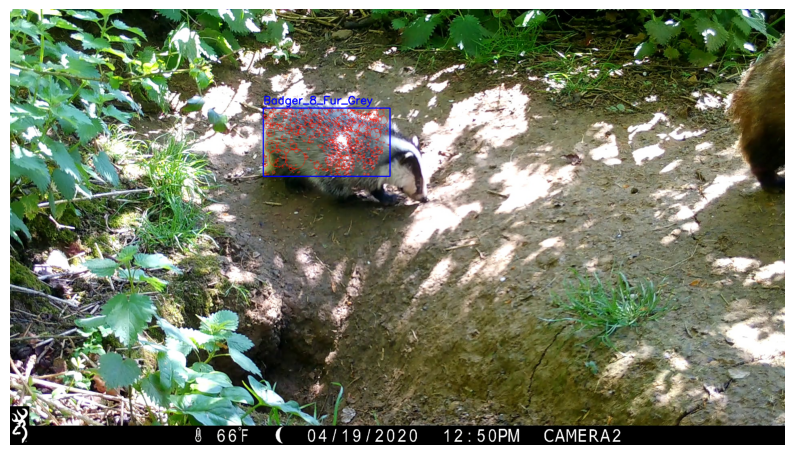

Loaded keypoints for IMG_0043_frame_2400.jpg


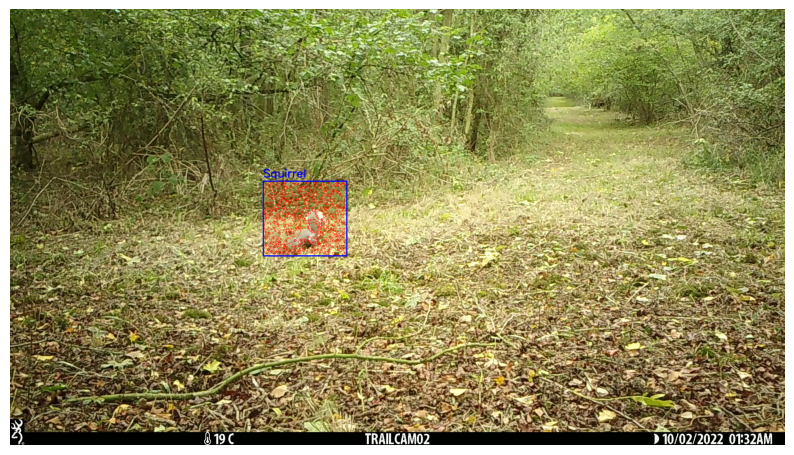

Loaded keypoints for CUBS_CALLING_UNDERGROUND_frame_300.jpg


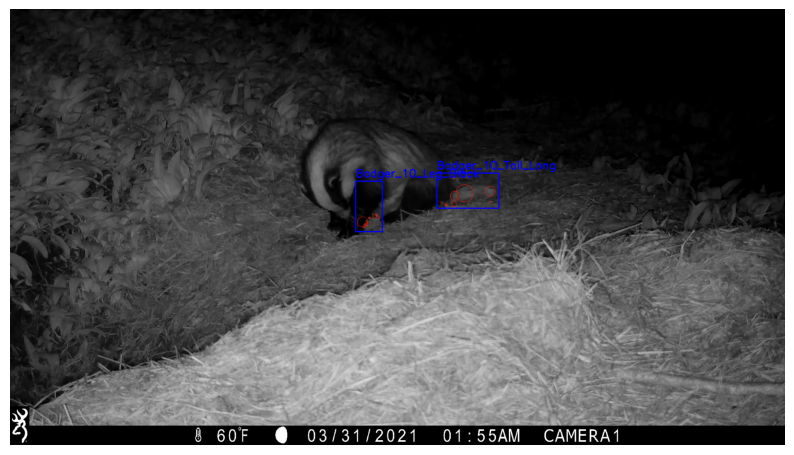

Loaded keypoints for IMG_0003 (2)_frame_420.jpg


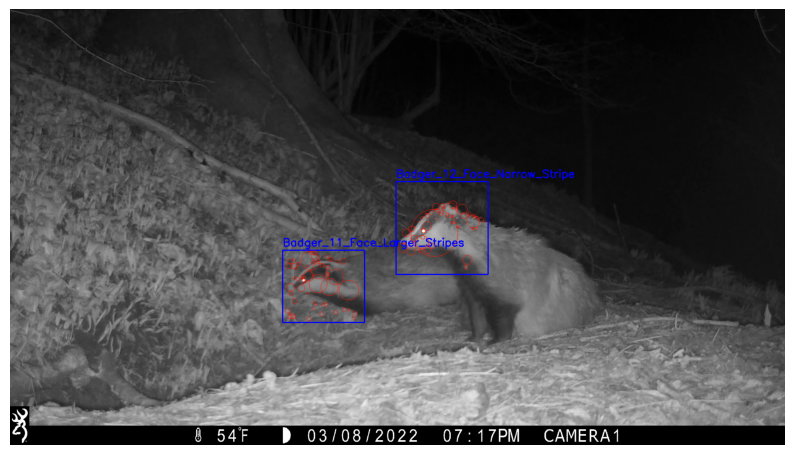

Loaded keypoints for badger_mum_with_2_cubs_1_frame_3540.jpg


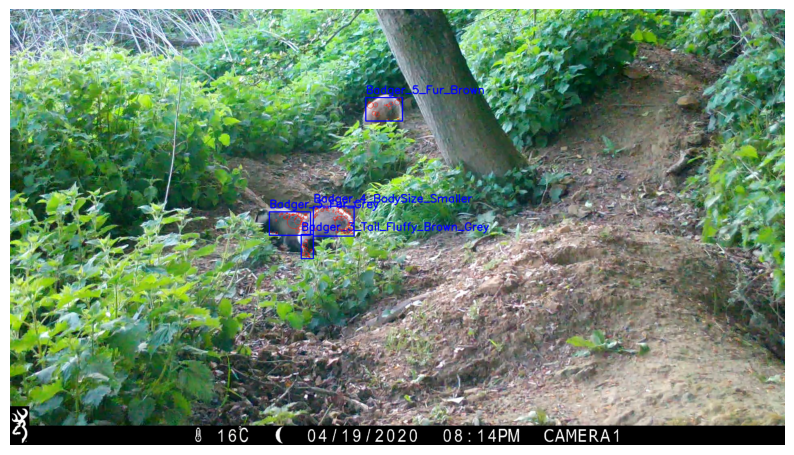

Loaded keypoints for IMG_0003_frame_3900.jpg


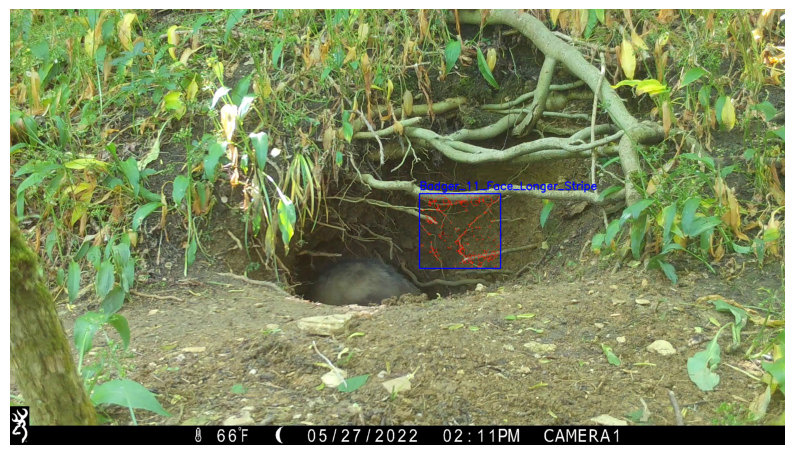

Loaded keypoints for IMG_0056_frame_1800.jpg


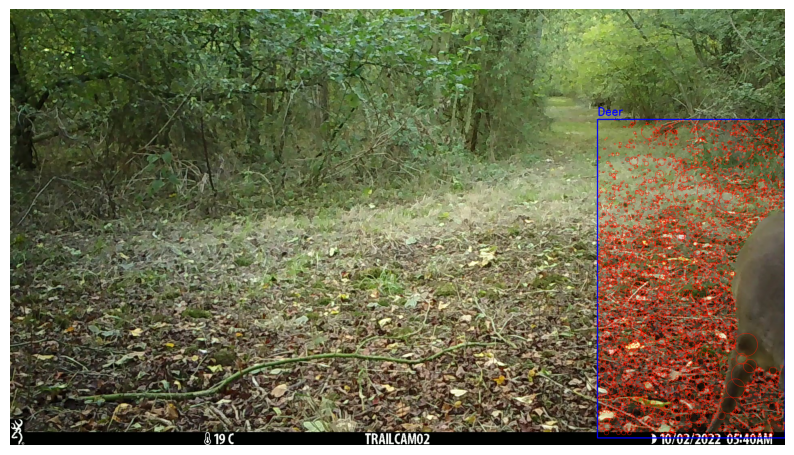

Loaded keypoints for boar_sow_with_cubs_frame_2640.jpg


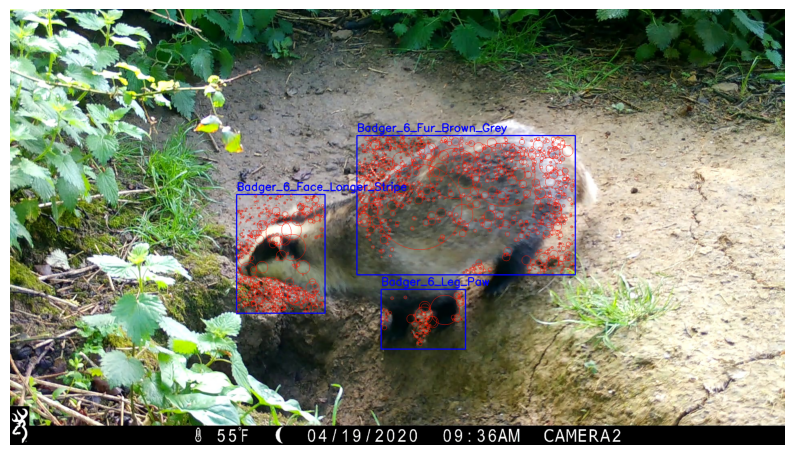

Loaded keypoints for IMG_0046_frame_360.jpg


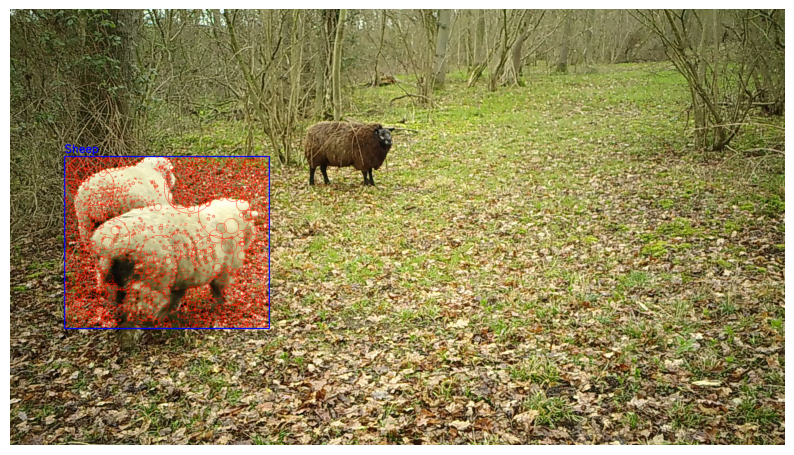

Loaded keypoints for IMG_0024_frame_360.jpg


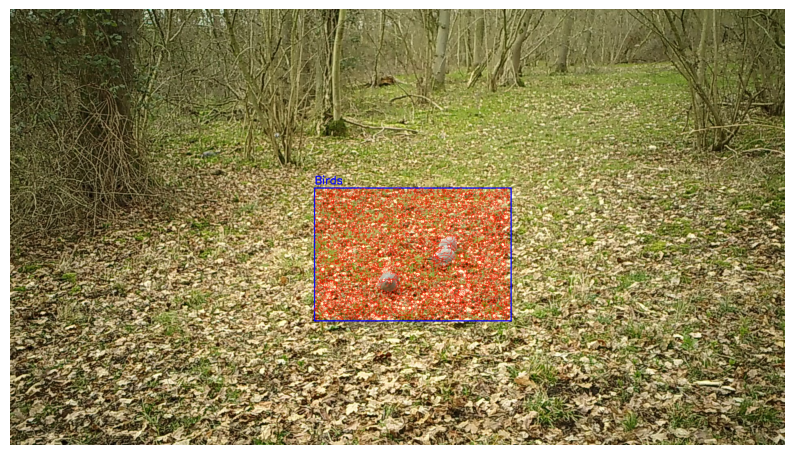

In [16]:
# Function to load keypoints from JSON file
def load_keypoints(file_path):
    with open(file_path, 'r') as f:
        keypoints_data = json.load(f)
    return keypoints_data

# Paths to the image and keypoints
images_dir = '/kaggle/input/project-ai/extracted_frames_zip/extracted_frames_zip/'
keypoints_dir = '/kaggle/working/keypoints_sift/'

# List of keypoints files
keypoints_files = [f for f in os.listdir(keypoints_dir) if f.endswith('_keypoints.json')]

# Draw and display keypoints and bounding boxes 
for keypoints_file in keypoints_files[5:15]:
    image_file = os.path.splitext(keypoints_file)[0].replace('_keypoints', '') + '.jpg'
    image_path = os.path.join(images_dir, image_file)
    keypoints_path = os.path.join(keypoints_dir, keypoints_file)
    if os.path.exists(image_path):
        keypoints_data = load_keypoints(keypoints_path)
        print(f"Loaded keypoints for {image_file}")
        annotation_file = os.path.splitext(image_file)[0] + '.xml'
        annotation_path = os.path.join(annotations_dir, annotation_file)
        if os.path.exists(annotation_path):
            draw_keypoints_and_bounding_boxes(image_path, annotation_path, keypoints_data)

In [17]:
# import cv2
# import os
# import json
# import numpy as np
# import matplotlib.pyplot as plt
# import gc
# import psutil
# import time

# def extract_and_save_keypoints_sift(image_path, output_dir, max_features=500):
#     image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
#     sift = cv2.SIFT_create(nfeatures=max_features)
#     keypoints, descriptors = sift.detectAndCompute(image, None)
    
#     keypoints_list = []
#     for kp in keypoints:
#         keypoints_list.append([kp.pt[0], kp.pt[1], kp.size, kp.angle, kp.response, kp.octave, kp.class_id])
    
#     output_file = os.path.join(output_dir, os.path.splitext(os.path.basename(image_path))[0] + '_keypoints.json')
#     with open(output_file, 'w') as f:
#         json.dump({'keypoints': keypoints_list, 'descriptors': descriptors.tolist()}, f)
#     print(f"Saved keypoints and descriptors to {output_file}")

# def inspect_json_content(file_path):
#     with open(file_path, 'r') as f:
#         data = json.load(f)
#     print(f"Content of {file_path}: {data}")

# def load_keypoints(file_path):
#     with open(file_path, 'r') as f:
#         data = json.load(f)
        
#     if 'keypoints' not in data or 'descriptors' not in data:
#         raise KeyError(f"Expected keys 'keypoints' and 'descriptors' not found in {file_path}")
    
#     keypoints = [cv2.KeyPoint(x=float(kp[0]), y=float(kp[1]), _size=float(kp[2]), _angle=float(kp[3]), _response=float(kp[4]), _octave=int(kp[5]), _class_id=int(kp[6])) for kp in data['keypoints']]
#     descriptors = np.array(data['descriptors'], dtype=np.float32)
#     return keypoints, descriptors

# def flann_feature_matching(image1_path, image2_path, keypoints1, keypoints2, descriptors1, descriptors2):
#     FLANN_INDEX_KDTREE = 1
#     index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
#     search_params = dict(checks=50)
    
#     flann = cv2.FlannBasedMatcher(index_params, search_params)
#     matches = flann.knnMatch(descriptors1, descriptors2, k=2)
    
#     good_matches = []
#     for m, n in matches:
#         if m.distance < 0.7 * n.distance:
#             good_matches.append(m)
    
#     img1 = cv2.imread(image1_path)
#     img2 = cv2.imread(image2_path)
    
#     img_matches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
#     plt.figure(figsize=(20, 10))
#     plt.imshow(img_matches)
#     plt.axis('off')
#     plt.show()
    
#     plt.clf()
#     plt.close()

# def log_memory_usage():
#     process = psutil.Process(os.getpid())
#     mem_info = process.memory_info()
#     print(f"Memory Usage: {mem_info.rss / 1024 ** 2:.2f} MB")

# keypoints_dir = '/kaggle/working/keypoints_sift/'
# images_dir = '/kaggle/input/project-ai/extracted_frames_zip/extracted_frames_zip/'

# # Uncomment the following lines if you need to re-extract keypoints
# # for image_file in os.listdir(images_dir):
# #     if image_file.endswith('.jpg'):
# #         image_path = os.path.join(images_dir, image_file)
# #         extract_and_save_keypoints_sift(image_path, keypoints_dir)

# keypoints_files = [f for f in os.listdir(keypoints_dir) if f.endswith('_keypoints.json')]

# batch_size = 3  # Further reduce the batch size

# for i in range(0, len(keypoints_files), batch_size):
#     batch_files = keypoints_files[i:i + batch_size]
#     keypoints1, descriptors1, keypoints2, descriptors2 = None, None, None, None
    
#     for j in range(len(batch_files)):
#         for k in range(j + 1, len(batch_files)):
#             image1_file = os.path.splitext(batch_files[j])[0].replace('_keypoints', '') + '.jpg'
#             image1_path = os.path.join(images_dir, image1_file)
#             keypoints1_path = os.path.join(keypoints_dir, batch_files[j])
            
#             image2_file = os.path.splitext(batch_files[k])[0].replace('_keypoints', '') + '.jpg'
#             image2_path = os.path.join(images_dir, image2_file)
#             keypoints2_path = os.path.join(keypoints_dir, batch_files[k])
            
#             try:
#                 keypoints1, descriptors1 = load_keypoints(keypoints1_path)
#                 keypoints2, descriptors2 = load_keypoints(keypoints2_path)
#             except KeyError as e:
#                 print(e)
#                 inspect_json_content(keypoints1_path)
#                 continue
            
#             flann_feature_matching(image1_path, image2_path, keypoints1, keypoints2, descriptors1, descriptors2)
    
#     # Clear variables and force garbage collection to free up memory
#     if keypoints1 is not None: del keypoints1
#     if descriptors1 is not None: del descriptors1
#     if keypoints2 is not None: del keypoints2
#     if descriptors2 is not None: del descriptors2
#     del batch_files
#     gc.collect()

#     # Log memory usage
#     log_memory_usage()
#     time.sleep(1)  # Add a small delay to allow the system to stabilize memory usage


In [18]:
# print("Keypoints1:", keypoints1[:5])  # Print first 5 keypoints for inspection
# print("Keypoints2:", keypoints2[:5])


In [19]:


# # Function to load keypoints from JSON file
# def load_keypoints(file_path):
#     with open(file_path, 'r') as f:
#         keypoints_data = json.load(f)
    
#     keypoints = []
#     descriptors = []
#     for cls_name, data in keypoints_data.items():
#         keypoints.extend(data['keypoints'])
#         descriptors.extend(data['descriptors'])
    
#     keypoints = np.array(keypoints, dtype=np.float32)
#     descriptors = np.array(descriptors, dtype=np.float32)
#     return keypoints, descriptors

# # Function to draw keypoints on image
# def draw_keypoints_on_image(image_path, keypoints):
#     image = cv2.imread(image_path)
#     for kp in keypoints:
#         x, y, size, angle, response, octave, class_id = kp
#         x = int(x)
#         y = int(y)
#         size = int(size)
#         cv2.circle(image, (x, y), size, (200, 20, 255), 1)
    
#     image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#     plt.figure(figsize=(10, 10))
#     plt.imshow(image_rgb)
#     plt.axis('off')
#     plt.show()

# # Paths to the image and keypoints directory
# images_dir = '/kaggle/input/project-ai/extracted_frames_zip/extracted_frames_zip/'
# keypoints_dir = '/kaggle/working/keypoints_sift/'

# # List of keypoints files
# keypoints_files = [f for f in os.listdir(keypoints_dir) if f.endswith('_keypoints.json')]

# # Draw and display keypoints for the first 10 images
# for keypoints_file in keypoints_files[:10]:
#     image_file = os.path.splitext(keypoints_file)[0].replace('_keypoints', '') + '.jpg'
#     image_path = os.path.join(images_dir, image_file)
#     keypoints_path = os.path.join(keypoints_dir, keypoints_file)
#     if os.path.exists(image_path):
#         keypoints, descriptors = load_keypoints(keypoints_path)
#         print(f"Loaded {len(keypoints)} keypoints and {len(descriptors)} descriptors for {image_file}")
#         draw_keypoints_on_image(image_path, keypoints)


In [20]:
# import os
# import cv2
# import xml.etree.ElementTree as ET
# import json

# def extract_and_save_keypoints(image_path, annotation_path, output_dir):
#     # Load image
#     image = cv2.imread(image_path)
    
#     # Parse XML annotation
#     tree = ET.parse(annotation_path)
#     root = tree.getroot()
#     image_keypoints = {}
    
#     for obj in root.iter('object'):
#         cls_name = obj.find('name').text
#         xmlbox = obj.find('bndbox')
#         xmin = int(xmlbox.find('xmin').text)
#         ymin = int(xmlbox.find('ymin').text)
#         xmax = int(xmlbox.find('xmax').text)
#         ymax = int(xmlbox.find('ymax').text)
        
#         # Extract region of interest
#         roi = image[ymin:ymax, xmin:xmax]
        
#         # Keypoint detection using ORB
#         orb = cv2.ORB_create()
#         keypoints, descriptors = orb.detectAndCompute(roi, None)
        
#         # Convert keypoints to a list of tuples
#         keypoints_list = [(kp.pt[0] + xmin, kp.pt[1] + ymin, kp.size, kp.angle, kp.response, kp.octave, kp.class_id) for kp in keypoints]
#         descriptors_list = descriptors.tolist() if descriptors is not None else []

#         image_keypoints[cls_name] = {
#             'keypoints': keypoints_list,
#             'descriptors': descriptors_list
#         }
    
#     # Save keypoints and descriptors to JSON file
#     image_id = os.path.splitext(os.path.basename(image_path))[0]
#     output_file = os.path.join(output_dir, f"{image_id}_keypoints.json")
#     with open(output_file, 'w') as f:
#         json.dump(image_keypoints, f)
# #     print(f"Saved keypoints to {output_file}")

# # Paths to the image and annotation directories
# images_dir = '/kaggle/input/project-ai/extracted_frames_zip/extracted_frames_zip/'
# annotations_dir = '/kaggle/input/project-ai/Annotation_01/Annotation_01/'
# output_dir = '/kaggle/working/keypoints'
# os.makedirs(output_dir, exist_ok=True)

# # Loop through the files and process each pair of image and annotation
# for image_file in os.listdir(images_dir):
#     if image_file.endswith('.jpg'):
#         image_path = os.path.join(images_dir, image_file)
#         annotation_file = os.path.splitext(image_file)[0] + '.xml'
#         annotation_path = os.path.join(annotations_dir, annotation_file)
#         if os.path.exists(annotation_path):
#             extract_and_save_keypoints(image_path, annotation_path, output_dir)



In [21]:
# import json
# import numpy as np
# import cv2
# import matplotlib.pyplot as plt

# def load_keypoints(file_path):
#     with open(file_path, 'r') as f:
#         keypoints_data = json.load(f)
    
#     keypoints = []
#     descriptors = []
#     for cls_name, data in keypoints_data.items():
#         keypoints.extend(data['keypoints'])
#         descriptors.extend(data['descriptors'])
    
#     keypoints = np.array(keypoints, dtype=np.float32)
#     descriptors = np.array(descriptors, dtype=np.float32)
#     return keypoints, descriptors

# def draw_keypoints_on_image(image_path, keypoints):
#     image = cv2.imread(image_path)
#     for kp in keypoints:
#         x, y, size, angle, response, octave, class_id = kp
#         x = int(x)
#         y = int(y)
#         size = int(size)
#         cv2.circle(image, (x, y), size, (200, 255, 200), 1)
    
#     image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#     plt.figure(figsize=(10, 10))
#     plt.imshow(image_rgb)
#     plt.axis('off')
#     plt.show()

# # Paths to the image and keypoints directory
# images_dir = '/kaggle/input/project-ai/extracted_frames_zip/extracted_frames_zip/'
# keypoints_dir = '/kaggle/working/keypoints/'

# # List of keypoints files
# keypoints_files = [f for f in os.listdir(keypoints_dir) if f.endswith('_keypoints.json')]

# # Draw and display keypoints for the first 10 images
# for keypoints_file in keypoints_files[20:25]:
#     image_file = os.path.splitext(keypoints_file)[0].replace('_keypoints', '') + '.jpg'
#     image_path = os.path.join(images_dir, image_file)
#     keypoints_path = os.path.join(keypoints_dir, keypoints_file)
#     if os.path.exists(image_path):
#         keypoints, descriptors = load_keypoints(keypoints_path)
#         print(f"Loaded {len(keypoints)} keypoints and {len(descriptors)} descriptors for {image_file}")
#         draw_keypoints_on_image(image_path, keypoints)


In [22]:
!pip install -r requirements.txt

ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


In [23]:
# Re-link Labels and Re-run Training

os.makedirs('/kaggle/working/dataset/labels/train', exist_ok=True)
os.makedirs('/kaggle/working/dataset/labels/val', exist_ok=True)

# Create symbolic links
!ln -sfn /kaggle/working/dataset/labels_yolo/train/* /kaggle/working/dataset/labels/train/
!ln -sfn /kaggle/working/dataset/labels_yolo/val/* /kaggle/working/dataset/labels/val/


# Verify symbolic links
print("Train labels:", os.listdir('/kaggle/working/dataset/labels/train')[:10])
print("Val labels:", os.listdir('/kaggle/working/dataset/labels/val')[:10])

Train labels: ['IMG_0014_frame_1740.xml', 'IMG_0056_frame_1320.txt', 'IMG_0023_frame_1020.xml', 'dominate_female_with_cubs_frame_480.txt', 'IMG_0008_frame_2160.xml', 'IMG_0068_frame_1500.xml', 'IMG_0003_frame_5040.txt', 'IMG_0046_frame_240.xml', 'IMG_0021_frame_300.xml', 'mum_with_cub_frame_3780.txt']
Val labels: ['IMG_0071_frame_60.txt', 'IMG_0014 (2)_frame_60.xml', 'IMG_0003 (2)_frame_420.txt', 'bum_pressing_2_frame_0.xml', 'IMG_0014_frame_1440.xml', 'IMG_0012_frame_180.txt', 'IMG_0047_frame_300.xml', 'IMG_0009_frame_600.xml', 'IMG_0009_frame_600.txt', 'mum_with_cub_frame_2640.xml']


In [24]:
# Install YOLOv5 dependencies 
!pip install -qr https://raw.githubusercontent.com/ultralytics/yolov5/master/requirements.txt

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
spopt 0.6.0 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
ydata-profiling 4.6.4 requires numpy<1.26,>=1.16.0, but you have numpy 1.26.4 which is incompatible.


In [25]:

# Clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 16620, done.
remote: Counting objects: 100% (98/98), done.
remote: Compressing objects: 100% (69/69), done.
remote: Total 16620 (delta 55), reused 62 (delta 29), pack-reused 16522
Receiving objects: 100% (16620/16620), 15.10 MiB | 12.61 MiB/s, done.
Resolving deltas: 100% (11414/11414), done.


In [26]:
# Verify the current working directory
%cd /kaggle/working/yolov5

/kaggle/working/yolov5


In [27]:
# List the contents of the yolov5
!ls models

__init__.py  experimental.py  segment  yolo.py	     yolov5m.yaml  yolov5s.yaml
common.py    hub	      tf.py    yolov5l.yaml  yolov5n.yaml  yolov5x.yaml


In [28]:
#  directory
%cd /kaggle/working/yolov5

/kaggle/working/yolov5


In [29]:
# model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
# for idx, module in enumerate(model.model.children()):
#     print(idx, module)

In [30]:


# Custom YOLO model that includes feature extraction

# import torch
# import torch.nn as nn

# class CustomYOLO(nn.Module):
#     def __init__(self, model_name='yolov5s', pretrained=True):
#         super(CustomYOLO, self).__init__()
#         self.model = torch.hub.load('ultralytics/yolov5', model_name, pretrained=pretrained)
#         self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#         self.model.to(self.device)

#         # Access the internal backbone or specific parts if the model is not Sequential
#         self.internal_model = self.model
#         self.features_layer = None

#         # Example: Attach hooks to extract features from a specific layer
#         for name, module in self.model.named_modules():
#             if '23' in name:  # This is just an example condition
#                 self.features_layer = module
#                 module.register_forward_hook(self.feature_hook)

#     def feature_hook(self, module, input, output):
#         self.features = output

#     def forward(self, x):
#         x = x.to(self.device)
#         detections = self.model(x)

#         # Assuming `detections` now includes bounding box predictions
#         # `self.features` will be set by the hook during forward pass
#         return detections, self.features if hasattr(self, 'features') else None

# # Example usage
# custom_model = CustomYOLO()
# custom_model.eval()

# # Test with a dummy input
# dummy_input = torch.randn(1, 3, 640, 640).to(custom_model.device)
# try:
#     detections, features = custom_model(dummy_input)
#     print("Detections:", detections)
#     print("Features Shape:", features.shape if features is not None else "No features extracted")
# except Exception as e:
#     print(e)





In [31]:
# import torch
# import torch.nn as nn

# class CustomYOLO(nn.Module):
#     def __init__(self, model_name='yolov5s', pretrained=True):
#         super(CustomYOLO, self).__init__()
#         self.model = torch.hub.load('ultralytics/yolov5', model_name, pretrained=pretrained)
#         self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#         self.model.to(self.device)
        
#         # Access the internal model
#         self.internal_model = self.model.model

#         # Initialize storage for features and detections
#         self.features = {}
        
#         # Register hooks to capture outputs from specific layers
#         self.register_hooks()

#     def register_hooks(self):
#         # Layers where you want to extract information
#         layer_targets = {
#             'model.model.23.m.0.cv2.act': 'features_23',  # Adjust based on your inspection of the model
#             'model.model.24.m.2': 'detections_24'
#         }
        
#         for name, module in self.internal_model.named_modules():
#             if any(key in name for key in layer_targets.keys()):
#                 module.register_forward_hook(self.create_hook(layer_targets.get(name)))

#     def create_hook(self, key):
#         def hook(module, input, output):
#             self.features[key] = output.detach()
#         return hook

#     def forward(self, x):
#         x = x.to(self.device)
#         _ = self.model(x)  # Forward pass through the model
#         # Retrieve features and detections from the registered hooks
#         return self.features.get('detections_24'), self.features.get('features_23')

# # Example usage
# custom_model = CustomYOLO()
# custom_model.eval()

# # Test with a dummy input
# dummy_input = torch.randn(1, 3, 640, 640).to(custom_model.device)
# try:
#     detections, features = custom_model(dummy_input)
#     print("Detections Shape:", detections.shape if detections is not None else "No detections")
#     print("Features Shape:", features.shape if features is not None else "No features extracted")
# except Exception as e:
#     print(e)







In [32]:
# import torch
# import torch.nn as nn

# class CustomYOLO(nn.Module):
#     def __init__(self, model_name='yolov5s', pretrained=True):
#         super(CustomYOLO, self).__init__()
#         self.model = torch.hub.load('ultralytics/yolov5', model_name, pretrained=pretrained)
#         self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        
#         # Move the model to the appropriate device
#         self.model.to(self.device)

#         # Access the internal structure of the model
#         self.internal_model = self.model.model  # Assuming this accesses the relevant layers directly

#         # Initialize storage for features
#         self.features = None

#         # Register hooks to capture outputs from specific layers
#         self.register_hooks()

#     def register_hooks(self):
#         # This example assumes you want to capture outputs from layer indices 20 and 23
#         # Find these layers by inspecting model.named_modules()
#         layer_names = [name for name, _ in self.internal_model.named_modules()]
#         print(layer_names)  # Optionally print all layer names to find the right index

#         # Assuming the names from your description:
#         target_layers = ['model.model.23', 'model.model.24.m.2']  # layer names

#         for name, module in self.internal_model.named_modules():
#             if name in target_layers:
#                 module.register_forward_hook(self.feature_hook)

#     def feature_hook(self, module, input, output):
#         self.features = output.detach()  # Store the features from the layer

#     def forward(self, x):
#         x = x.to(self.device)
#         detections = self.model(x)
#         return detections, self.features

# # Example usage
# custom_model = CustomYOLO()
# custom_model.eval()

# # Test with a dummy input
# dummy_input = torch.randn(1, 3, 640, 640).to(custom_model.device)
# try:
#     detections, features = custom_model(dummy_input)
#     print("Detections:", detections)
#     print("Features Shape:", features.shape if features is not None else "No features extracted")
# except Exception as e:
#     print(e)


In [33]:
import os
import subprocess
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import classification_report, roc_curve, auc
import yaml
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK, STATUS_FAIL
import gc
import json

def update_and_train(hyp_params, base_command, iteration):
    hyp_path = '/kaggle/working/hyp.yaml'
    if not os.path.exists(hyp_path):
        print(f"Error: Hyperparameter file not found at {hyp_path}")
        return None

    with open(hyp_path, 'r') as file:
        hyp = yaml.safe_load(file)
    hyp.update(hyp_params)
    with open(hyp_path, 'w') as file:
        yaml.safe_dump(hyp, file)

    run_name = f"badger_detection_{iteration}"
    command = f"{base_command} --name {run_name}"
    print(f"Running training with updated hyperparameters: {hyp_params} and run name: {run_name}")

    try:
        subprocess.run(command, shell=True, check=True)
    except subprocess.CalledProcessError as e:
        print(f"Training command failed with error: {e}")
        return None

    return run_name

# Base training command
base_command = "python train.py --img 640 --epochs 50 --data /kaggle/working/badger.yaml --cfg models/yolov5s.yaml --weights yolov5s.pt --hyp /kaggle/working/hyp.yaml --save-period 10"

# hyperparameter space
space = {
    'lr0': hp.choice('lr0', [0.04, 0.06, 0.05]),
    'batch_size': hp.choice('batch_size', [8, 16]),  # Smaller batch sizes
    'momentum': hp.uniform('momentum', 0.85, 0.95)
}


# Number of iterations for Bayesian Optimization
max_evals = 5
iteration = 0

# Perform Bayesian Optimization
trials = Trials()




In [ ]:
def objective(params):
    global iteration
    iteration += 1
    run_name = update_and_train(params, base_command, iteration)

    if run_name:
        model_weights_path = f"runs/train/{run_name}/weights/best.pt"
        if os.path.exists(model_weights_path):
            val_command = f"python val.py --data /kaggle/working/badger.yaml --weights {model_weights_path} --img 640 --save-txt --save-conf --save-json"
            print(f"Running validation for {run_name}")
            subprocess.run(val_command, shell=True)
            
            # Dynamically find the latest exp directory
            val_dir = "runs/val/"
            exp_dirs = sorted([d for d in os.listdir(val_dir) if d.startswith('exp')], key=lambda x: os.path.getctime(os.path.join(val_dir, x)))
            if exp_dirs:
                latest_exp_dir = exp_dirs[-1]
                pred_path = os.path.join(val_dir, latest_exp_dir, 'best_predictions.json')
                true_dir = os.path.join(val_dir, latest_exp_dir, 'labels')
            
            if os.path.exists(pred_path) and os.path.exists(true_dir):
                # predictions and labels 
                return {'loss': 0, 'status': STATUS_OK}
            else:
                print(f"Predictions or labels not found for {run_name}, skipping evaluation.")
                return {'loss': float('inf'), 'status': STATUS_FAIL}
        else:
            print(f"Model weights not found for {run_name}, skipping validation.")
            return {'loss': float('inf'), 'status': STATUS_FAIL}
    else:
        print(f"Skipping validation due to training failure for iteration {iteration}")
        return {'loss': float('inf'), 'status': STATUS_FAIL}

best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=max_evals, trials=trials)

print(f"Best hyperparameters: {best}")

# Save the best run for further evaluation
best_run_name = f"badger_detection_{trials.best_trial['tid']}"
best_model_weights_path = f"runs/train/{best_run_name}/weights/best.pt"

# best weights 
if not os.path.exists(best_model_weights_path):
    for i in range(1, max_evals + 1):  # Start from 1 instead of 0
        alternative_model_weights_path = f"runs/train/badger_detection_{i}/weights/best.pt"
        if os.path.exists(alternative_model_weights_path):
            best_model_weights_path = alternative_model_weights_path
            best_run_name = f"badger_detection_{i}"
            break

# Save best run name and path
with open('best_run_info.txt', 'w') as f:
    f.write(f"{best_run_name}\n{best_model_weights_path}")

# Clear variables and force garbage free up memory
del best_run_name, best_model_weights_path, trials
gc.collect()

Running training with updated hyperparameters: {'batch_size': 8, 'lr0': 0.06, 'momentum': 0.8968452259592192} and run name: badger_detection_1
  0%|          | 0/5 [00:00<?, ?trial/s, best loss=?]

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-05-20 08:39:06.063454: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 08:39:06.063550: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-20 08:39:06.152401: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/kaggle/working/badger.yaml, hyp=/kaggle/working/hyp.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False

Running validation for badger_detection_1            
  0%|          | 0/5 [14:40<?, ?trial/s, best loss=?]

val: data=/kaggle/working/badger.yaml, weights=['runs/train/badger_detection_1/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=True, save_json=True, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-313-g712de55a Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7298704 parameters, 0 gradients, 16.7 GFLOPs
val: Scanning /kaggle/working/dataset/labels/val.cache... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 6/6 [00:12<00:00,  2.02s/it]
                   all        169        394      0.796      0.745      0.819      0.552
Speed: 0.2ms pre-process, 6.1ms inference, 9.0ms NMS per image at sha

requirements: Ultralytics requirement ['pycocotools>=2.0.6'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 61.7 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 11.2s, installed 1 package: ['pycocotools>=2.0.6']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

loading annotations into memory...


pycocotools unable to run: [Errno 2] No such file or directory: '/kaggle/working/yolov5/annotations/instances_val2017.json'
Results saved to runs/val/exp
169 labels saved to runs/val/exp/labels


Running training with updated hyperparameters: {'batch_size': 16, 'lr0': 0.04, 'momentum': 0.8750423308823142} and run name: badger_detection_2
 20%|██        | 1/5 [15:15<1:01:02, 915.64s/trial, best loss: 0.0]

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-05-20 08:54:20.272359: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 08:54:20.272418: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-20 08:54:20.274039: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/kaggle/working/badger.yaml, hyp=/kaggle/working/hyp.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False

Running validation for badger_detection_2                          
 20%|██        | 1/5 [29:41<1:01:02, 915.64s/trial, best loss: 0.0]

val: data=/kaggle/working/badger.yaml, weights=['runs/train/badger_detection_2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=True, save_json=True, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-313-g712de55a Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7298704 parameters, 0 gradients, 16.7 GFLOPs
val: Scanning /kaggle/working/dataset/labels/val.cache... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 6/6 [00:11<00:00,  1.95s/it]
                   all        169        394      0.815      0.773      0.862      0.598
Speed: 0.2ms pre-process, 5.8ms inference, 8.2ms NMS per image at sha

loading annotations into memory...


pycocotools unable to run: [Errno 2] No such file or directory: '/kaggle/working/yolov5/annotations/instances_val2017.json'
Results saved to runs/val/exp2
169 labels saved to runs/val/exp2/labels


Running training with updated hyperparameters: {'batch_size': 16, 'lr0': 0.04, 'momentum': 0.9454739356628938} and run name: badger_detection_3
 40%|████      | 2/5 [30:05<45:01, 900.55s/trial, best loss: 0.0]

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-05-20 09:09:10.190436: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 09:09:10.190491: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-20 09:09:10.192067: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/kaggle/working/badger.yaml, hyp=/kaggle/working/hyp.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False

Running validation for badger_detection_3                        
 40%|████      | 2/5 [44:51<45:01, 900.55s/trial, best loss: 0.0]

val: data=/kaggle/working/badger.yaml, weights=['runs/train/badger_detection_3/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=True, save_json=True, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-313-g712de55a Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7298704 parameters, 0 gradients, 16.7 GFLOPs
val: Scanning /kaggle/working/dataset/labels/val.cache... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 6/6 [00:12<00:00,  2.04s/it]
                   all        169        394      0.815      0.731      0.834      0.592
Speed: 0.2ms pre-process, 5.1ms inference, 10.5ms NMS per image at sh

loading annotations into memory...


pycocotools unable to run: [Errno 2] No such file or directory: '/kaggle/working/yolov5/annotations/instances_val2017.json'
Results saved to runs/val/exp3
169 labels saved to runs/val/exp3/labels


Running training with updated hyperparameters: {'batch_size': 8, 'lr0': 0.05, 'momentum': 0.903340229645466} and run name: badger_detection_4
 60%|██████    | 3/5 [45:16<30:10, 905.24s/trial, best loss: 0.0]

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-05-20 09:24:21.124019: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 09:24:21.124079: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-20 09:24:21.125604: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/kaggle/working/badger.yaml, hyp=/kaggle/working/hyp.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False

Running validation for badger_detection_4                        
 60%|██████    | 3/5 [59:45<30:10, 905.24s/trial, best loss: 0.0]

val: data=/kaggle/working/badger.yaml, weights=['runs/train/badger_detection_4/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=True, save_json=True, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-313-g712de55a Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7298704 parameters, 0 gradients, 16.7 GFLOPs
val: Scanning /kaggle/working/dataset/labels/val.cache... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 6/6 [00:11<00:00,  1.95s/it]
                   all        169        394      0.794      0.744      0.833      0.573
Speed: 0.2ms pre-process, 5.2ms inference, 10.3ms NMS per image at sh

loading annotations into memory...


pycocotools unable to run: [Errno 2] No such file or directory: '/kaggle/working/yolov5/annotations/instances_val2017.json'
Results saved to runs/val/exp4
169 labels saved to runs/val/exp4/labels


Running training with updated hyperparameters: {'batch_size': 16, 'lr0': 0.04, 'momentum': 0.8897830521052634} and run name: badger_detection_5
 80%|████████  | 4/5 [1:00:10<15:00, 900.66s/trial, best loss: 0.0]

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-05-20 09:39:14.715498: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 09:39:14.715552: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-20 09:39:14.717229: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/kaggle/working/badger.yaml, hyp=/kaggle/working/hyp.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False

In [ ]:
def plot_confusion_matrix(cm, classes, iteration):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix - Iteration {iteration}')
    plt.show()

# def plot_roc_curve(y_true, y_pred_proba, classes, iteration):
#     plt.figure(figsize=(10, 8))
#     for i in range(len(classes)):
#         fpr, tpr, _ = roc_curve(y_true == i, y_pred_proba[:, i])
#         roc_auc = auc(fpr, tpr)
#         plt.plot(fpr, tpr, label=f'Class {classes[i]} (AUC = {roc_auc:.2f})')
#     plt.plot([0, 1], [0, 1], 'k--')
#     plt.xlim([0.0, 1.0])
#     plt.ylim([0.0, 1.05])
#     plt.xlabel('False Positive Rate')
#     plt.ylabel('True Positive Rate')
# #     plt.title(f'ROC Curve - Iteration {iteration}')
#     plt.legend(loc="lower right")
#     plt.show()

In [ ]:
def evaluate_best_model(best_run_name, best_model_weights_path):
    val_command = f"python val.py --data /kaggle/working/badger.yaml --weights {best_model_weights_path} --img 640 --save-txt --save-conf --save-json"
    subprocess.run(val_command, shell=True)

    # paths to predictions and labels 
    pred_path = f"runs/val/{best_run_name}/best_predictions.json"
    true_dir = f"runs/val/{best_run_name}/labels"
    
    if not os.path.exists(pred_path):
        # Check for the latest exp 
        val_dir = "runs/val/"
        exp_dirs = sorted([d for d in os.listdir(val_dir) if d.startswith('exp')], key=lambda x: os.path.getctime(os.path.join(val_dir, x)))
        if exp_dirs:
            latest_exp_dir = exp_dirs[-1]
            pred_path = os.path.join(val_dir, latest_exp_dir, 'best_predictions.json')
            true_dir = os.path.join(val_dir, latest_exp_dir, 'labels')
    
    if os.path.exists(pred_path) and os.path.exists(true_dir):
        with open(pred_path, 'r') as f:
            predictions = json.load(f)

        # Verify of the predictions
        if not predictions:
            print("No predictions found in the JSON file.")
            return

        example_prediction = predictions[0]
        print(f"Example prediction structure: {example_prediction}")

        y_pred_proba = []
        y_true = []
        num_categories = len(set(pred['category_id'] for pred in predictions))
        print(f"Number of categories: {num_categories}")
        
        for label_file in os.listdir(true_dir):
            label_path = os.path.join(true_dir, label_file)
            if label_file.endswith('.txt'):
                true_labels = np.loadtxt(label_path, dtype=int).flatten()
                image_id = label_file.replace('.txt', '')
                pred_probs = [pred['score'] for pred in predictions if pred['image_id'] == image_id]
                pred_category_ids = [pred['category_id'] for pred in predictions if pred['image_id'] == image_id]

#                 print(f"Processing image {image_id}")
#                 print(f"True labels: {true_labels}")
#                 print(f"Predicted probabilities: {pred_probs}")
#                 print(f"Predicted category IDs: {pred_category_ids}")

                if len(pred_probs) == len(pred_category_ids):
                    # Create a zero array for predicted probabilities
                    pred_probs_full = np.zeros((len(true_labels), num_categories))
                    for idx, cat_id in enumerate(pred_category_ids):
                        if cat_id < num_categories:  # category ID is within range
                            pred_probs_full[:, cat_id] = pred_probs[idx]
                        else:
                            print(f"Skipping category ID {cat_id} as it exceeds the number of categories.")
                    
                    if len(true_labels) == pred_probs_full.shape[0]:
                        y_true.extend(true_labels)
                        y_pred_proba.extend(pred_probs_full)
                    else:
                        print(f"Skipping image {image_id} due to mismatch in true labels length.")
                else:
                    print(f"Skipping image {image_id} due to mismatch in number of predicted probabilities and categories.")

        y_true = np.array(y_true)
        y_pred_proba = np.array(y_pred_proba)
        
        print(f"y_true shape: {y_true.shape}")
        print(f"y_pred_proba shape: {y_pred_proba.shape}")

        # both arrays are the same length 
        if len(y_true) == y_pred_proba.shape[0] and len(y_true) > 0:
            f1 = metrics.f1_score(y_true, y_pred_proba.argmax(axis=1), average='macro')
#             roc_auc = metrics.roc_auc_score(y_true, y_pred_proba, multi_class='ovo', average='macro')
            confusion_mat = metrics.confusion_matrix(y_true, y_pred_proba.argmax(axis=1))
            
            # Dynamically generate target names based on number of categories
            target_names = [f"Class {i}" for i in range(num_categories)]
            class_report = classification_report(y_true, y_pred_proba.argmax(axis=1), target_names=target_names)

            print("F1 Score:", f1)
#             print("ROC-AUC:", roc_auc)
            print("Confusion Matrix:\n", confusion_mat)
            print("Classification Report:\n", class_report)

            plot_confusion_matrix(confusion_mat, classes=target_names, iteration='best')
#             plot_roc_curve(y_true, y_pred_proba, classes=target_names, iteration='best')
        else:
            print("Mismatch between the number of true and predicted labels or no data to evaluate.")
    else:
        print("Predictions or labels not found for evaluation.")

# Load best run details
with open('best_run_info.txt', 'r') as f:
    best_run_name = f.readline().strip()
    best_model_weights_path = f.readline().strip()

# Evaluate the best model
evaluate_best_model(best_run_name, best_model_weights_path)

In [ ]:
# Paths
new_images_path = '/kaggle/input/project-ai/Badger Photos'

# Update YAML file if necessary (manually or programmatically)

# Run detection
# source path is enclosed in quotes to handle spaces
detect_command = f'python detect.py --weights "{model_weights_path}" --img 640 --conf 0.25 --source "{temp_dir}"'
result = subprocess.run(detect_command, shell=True, capture_output=True, text=True)

# Check there were errors 
if result.returncode == 0:
    print("Detection completed successfully. Check the runs/detect/exp folder for outputs.")
else:
    print("Detection failed. Error output:")
    print(result.stderr)

In [ ]:
def test_on_unseen_images(model_weights_path, images_list):
    temp_dir = "temp_unseen_images"
    
    # Create a temporary directory to store the selected images
    os.makedirs(temp_dir, exist_ok=True)
    
    # Copy the selected images to the temporary directory
    for image_path in images_list:
        shutil.copy(image_path, temp_dir)
    
    #  run the detection
    test_command = f'python detect.py --weights "{model_weights_path}" --img 640 --conf 0.1 --source "{temp_dir}"'  # Lowered conf threshold to 0.1
    print(f"Testing on unseen images using model weights from {model_weights_path}")
    subprocess.run(test_command, shell=True)
    
    # Clean up by removing the temporary directory
    shutil.rmtree(temp_dir)

# unseen images
unseen_images_dir = "/kaggle/input/project-ai/Badger Photos/"

# checking best model weights path exists
if not os.path.exists(best_model_weights_path):
    for i in range(1, max_evals + 1):  # Start from 1 
        alternative_model_weights_path = f"runs/train/badger_detection_{i}/weights/best.pt"
        if os.path.exists(alternative_model_weights_path):
            best_model_weights_path = alternative_model_weights_path
            best_run_name = f"badger_detection_{i}"
            break

if os.path.exists(unseen_images_dir) and os.path.exists(best_model_weights_path):
    # Get all images 
    all_images = [os.path.join(unseen_images_dir, img) for img in os.listdir(unseen_images_dir) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    # 10 random images
    if len(all_images) > 10:
        selected_images = random.sample(all_images, 10)
    else:
        selected_images = all_images
    
    print("Selected images for testing:", selected_images)
    
    # Test on random images
    test_on_unseen_images(best_model_weights_path, selected_images)
else:
    print("Unseen images directory or best model weights not found.")

In [ ]:

# def update_and_train(hyp_params, base_command, iteration):
#     hyp_path = '/kaggle/working/hyp.yaml'
#     with open(hyp_path, 'r') as file:
#         hyp = yaml.safe_load(file)
#     hyp.update(hyp_params)
#     with open(hyp_path, 'w') as file:
#         yaml.safe_dump(hyp, file)

#     # Modify the base command to include a unique run name for each iteration
#     run_name = f"custom_badger_detection_{iteration}"
#     command = f"{base_command} --name {run_name}"
#     print(f"Running training with updated hyperparameters: {hyp_params} and run name: {run_name}")
#     subprocess.run(command, shell=True)
#     return run_name

# # Base training command
# base_command = "python train.py --img 640 --epochs 80 --data /kaggle/working/badger.yaml --cfg models/yolov5s.yaml --weights yolov5s.pt --hyp /kaggle/working/hyp.yaml"

# # Define hyperparameter space
# learning_rate_options = [0.01, 0.005, 0.001]
# batch_size_options = [16, 32]

# # Number of iterations for random search
# num_iterations = 5

# # Perform random search and validate each model
# for i in range(num_iterations):
#     lr = random.choice(learning_rate_options)
#     batch_size = random.choice(batch_size_options)
#     hyp_params = {'lr0': lr, 'batch_size': batch_size}
#     run_name = update_and_train(hyp_params, base_command, i)

#     # Validation for each trained model
#     val_command = f"python val.py --data /kaggle/working/badger.yaml --weights runs/train/{run_name}/weights/best.pt --img 640"
#     print(f"Running validation for {run_name}")
#     subprocess.run(val_command, shell=True)





In [ ]:
# class CustomYOLO(nn.Module):
#     def __init__(self, model_name='yolov5s', pretrained=True):
#         super(CustomYOLO, self).__init__()
#         self.model = torch.hub.load('ultralytics/yolov5', model_name, pretrained=pretrained)
#         self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        
#         # Move the model to the appropriate device
#         self.model.to(self.device)

#         # Access the internal structure of the model
#         self.internal_model = self.model.model  # Assuming this accesses the relevant layers directly

#         # Initialize storage for features
#         self.features = None

#         # Register hooks to capture outputs from specific layers
#         self.register_hooks()

#     def register_hooks(self):
#         # This example assumes you want to capture outputs from layer indices 20 and 23
#         # Find these layers by inspecting model.named_modules()
#         layer_names = [name for name, _ in self.internal_model.named_modules()]
#         print(layer_names)  # Optionally print all layer names to find the right index

#         # Assuming the names from your description:
#         target_layers = ['model.model.23', 'model.model.24.m.2']  # layer names

#         for name, module in self.internal_model.named_modules():
#             if name in target_layers:
#                 module.register_forward_hook(self.feature_hook)

#     def feature_hook(self, module, input, output):
#         self.features = output.detach()  # Store the features from the layer

#     def forward(self, x):
#         x = x.to(self.device)
#         detections = self.model(x)
#         return detections, self.features

# # Example usage
# custom_model = CustomYOLO()
# custom_model.eval()

# # Test with a dummy input
# dummy_input = torch.randn(1, 3, 640, 640).to(custom_model.device)
# try:
#     detections, features = custom_model(dummy_input)
#     print("Detections:", detections)
#     print("Features Shape:", features.shape if features is not None else "No features extracted")
# except Exception as e:
#     print(e)

In [ ]:
import torch
import torch.nn as nn

class CustomYOLO(nn.Module):
    def __init__(self, model_name='yolov5s', pretrained=True):
        super(CustomYOLO, self).__init__()
        self.model = torch.hub.load('ultralytics/yolov5', model_name, pretrained=pretrained)
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model.to(self.device)
        self.features = None
        

        # Access the internal backbone or specific parts if the model is not Sequential
        self.internal_model = self.model
        self.features_layer = None

        # Example: Attach hooks to extract features from a specific layer
        for name, module in self.model.named_modules():
            if '23' in name:  # This is just an example condition
                self.features_layer = module
                module.register_forward_hook(self.feature_hook)
                print(f"Hooked layer: {name}")

    def feature_hook(self, module, input, output):
        self.features = output
        print(f"Features extracted: {self.features.shape}")

    def forward(self, x):
        x = x.to(self.device)
        self.features = None
        detections = self.model(x)

        # Assuming `detections` now includes bounding box predictions
        # `self.features` will be set by the hook during forward pass
        return detections, self.features if hasattr(self, 'features') else None

# Example usage
custom_model = CustomYOLO()
custom_model.eval()

# Test with a dummy input
dummy_input = torch.randn(1, 3, 640, 640).to(custom_model.device)
try:
    detections, features = custom_model(dummy_input)
    print("Detections:", detections)
    print("Features Shape:", features.shape if features is not None else "No features extracted")
except Exception as e:
    print(e)

In [ ]:
import torch
import torch.nn as nn
import torch.hub
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import os
import numpy as np
from tqdm import tqdm
import pickle
from PIL import Image, UnidentifiedImageError


class ImageDataset(Dataset):
    def __init__(self, folder_path):
        self.files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
        self.transform = transforms.Compose([
            transforms.Resize((640, 640)),  # Matching the YOLO input size
            transforms.ToTensor(),
        ])
        

    def __len__(self):
        return len(self.files)

    def __getitem__(self, index):
        image = Image.open(self.files[index]).convert('RGB')
        image = self.transform(image)
        return image

# Path to the images
images_path = '/kaggle/input/project-ai/extracted_frames_zip/extracted_frames_zip'


# Instantiate the dataset and dataloader
dataset = ImageDataset(images_path)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=4)  # Increased batch size and workers

# Initialize your custom YOLO model
custom_model = CustomYOLO()
custom_model.eval()



# Function to extract features
def extract_features(dataloader, model):
    model.eval()
    features_list = []
    with torch.no_grad():
        for images in tqdm(dataloader, desc="Extracting features"):
            images = images.to(model.device)
            _, features = model(images)  # Assuming the second return is features
            if features is not None:
                features_list.extend(features.cpu().numpy())  # Collect features
    return features_list

# Extract features
features = extract_features(dataloader, custom_model)

# Verify the shape of the extracted features
# if features:
#     print("Extracted features shape:", features[0].shape)
# else:
#     print("No features extracted.")

# Save features for later use
with open("badger_features.pkl", "wb") as f:
    pickle.dump(features, f)



In [ ]:
# After loading features_dict
print(f"Type of features: {type(features)}")


In [ ]:


# Load the extracted features
with open("badger_features.pkl", "rb") as f:
    features = pickle.load(f)

# Verify the loaded data structure
if isinstance(features, list):
    print("Loaded features is a list.")
else:
    print(f"Unexpected data type: {type(features)}")

In [ ]:
import os
import numpy as np
import h5py
import shutil
import psutil

def check_disk_space():
    total, used, free = shutil.disk_usage("/")
    return free

def create_pairs_and_save_in_batches(features, batch_size=100, output_file='pairs.h5'):
    num_features = len(features)
    pairs_shape = (0, 2, features[0].shape[0], features[0].shape[1], features[0].shape[2])
    labels_shape = (0,)
    
    with h5py.File(output_file, 'w') as f:
        pairs_dataset = f.create_dataset('pairs', shape=pairs_shape, maxshape=(None, 2, features[0].shape[0], features[0].shape[1], features[0].shape[2]), dtype='float32')
        labels_dataset = f.create_dataset('labels', shape=labels_shape, maxshape=(None,), dtype='int32')
        
        def save_batch(pairs, labels):
            current_size = pairs_dataset.shape[0]
            new_size = current_size + len(pairs)
            pairs_dataset.resize(new_size, axis=0)
            labels_dataset.resize(new_size, axis=0)
            pairs_dataset[current_size:new_size] = pairs
            labels_dataset[current_size:new_size] = labels
            del pairs, labels
        
        for i in range(0, num_features, batch_size):
            for j in range(i, num_features, batch_size):
                pairs = []
                labels = []
                for k in range(i, min(i + batch_size, num_features)):
                    for l in range(j, min(j + batch_size, num_features)):
                        if k == l:
                            pairs.append([features[k], features[l]])
                            labels.append(1)
                        else:
                            pairs.append([features[k], features[l]])
                            labels.append(0)
                save_batch(np.array(pairs), np.array(labels))
                print(f"Processed batch ({i}, {j})")

                # Check available disk space
                if check_disk_space() < 1e9:  # Less than 1GB
                    raise OSError("Not enough disk space. Aborting the operation.")

# Check initial disk space
initial_free_space = check_disk_space()
print(f"Initial free space: {initial_free_space / 1e9} GB")

# Create pairs and save them in batches
try:
    create_pairs_and_save_in_batches(features, batch_size=50)  # Reduced batch size
except OSError as e:
    print(f"Error: {e}")

# Verify the saved pairs
if os.path.exists('pairs.h5'):
    with h5py.File('pairs.h5', 'r') as f:
        pairs = f['pairs'][:]
        labels = f['labels'][:]
        print("Number of pairs:", len(pairs))
        print("Pair example:", pairs[0])
        print("Label example:", labels[0])
else:
    print("Pairs file was not created due to insufficient disk space.")


In [ ]:
# Function to create pairs of features
def create_pairs(features):
    pairs = []
    labels = []
    num_features = len(features)
    
    # Positive pairs (same class)
    for feature in features:
        pairs.append([feature, feature])
        labels.append(1)
    
    # Negative pairs (different classes)
    for i in range(num_features):
        for j in range(i + 1, num_features):
            pairs.append([features[i], features[j]])
            labels.append(0)

    return np.array(pairs), np.array(labels)

# Create pairs
pairs, labels = create_pairs(features)

# Verify the created pairs
print("Number of pairs:", len(pairs))
print("Pair example:", pairs[0])
print("Label example:", labels[0])

In [ ]:
# Define and Train the Siamese Network

import torch.nn.functional as F

class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.fc1 = nn.Linear(512*20*20, 4096)
        self.fc2 = nn.Linear(4096, 1)

    def forward_one(self, x):
        x = x.view(x.size(0), -1)  # Flatten
        x = F.relu(self.fc1(x))
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        distance = F.pairwise_distance(output1, output2)
        return distance

# Create DataLoader for training
from torch.utils.data import Dataset, DataLoader

class SiameseDataset(Dataset):
    def __init__(self, pairs, labels):
        self.pairs = pairs
        self.labels = labels

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        pair = self.pairs[idx]
        label = self.labels[idx]
        return torch.tensor(pair[0], dtype=torch.float32), torch.tensor(pair[1], dtype=torch.float32), torch.tensor(label, dtype=torch.float32)

# Initialize dataset and dataloader
siamese_dataset = SiameseDataset(pairs, labels)
siamese_dataloader = DataLoader(siamese_dataset, shuffle=True, batch_size=16)

# Initialize the Siamese network
siamese_model = SiameseNetwork().to(custom_model.device)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(siamese_model.parameters(), lr=0.001)

# Training loop
num_epochs = 1
for epoch in range(num_epochs):
    siamese_model.train()
    running_loss = 0.0
    for data in siamese_dataloader:
        img1, img2, label = data
        img1, img2, label = img1.to(custom_model.device), img2.to(custom_model.device), label.to(custom_model.device)
        
        optimizer.zero_grad()
        outputs = siamese_model(img1, img2)
        loss = criterion(outputs, label)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
    
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(siamese_dataloader)}")


In [ ]:


# # Load the model
# model = torch.hub.load('ultralytics/yolov5', 'custom', path='runs/train/badger_detection6/weights/best.pt')

# # Set the directory to images are stored
# image_dir = '/kaggle/working/dataset/images/val'
# image_files = os.listdir(image_dir)

# # Print all image paths 
# print("All image files:")
# for f in image_files:
#     print(os.path.join(image_dir, f))

# # to check valid image
# def is_valid_image(file_path):
#     try:
#         img = cv2.imread(file_path)
#         if img is None:
#             return False
#         return True
#     except Exception as e:
#         print(f"Error verifying image {file_path}: {e}")
#         return False

# # Filter invalid image files
# valid_image_files = [f for f in image_files if is_valid_image(os.path.join(image_dir, f))]
# print(f"Found {len(valid_image_files)} valid images.")

# # Check for 10 valid images, otherwise use all of them
# if len(valid_image_files) < 10:
#     selected_images = valid_image_files
# else:
#     selected_images = random.sample(valid_image_files, 10)

# print(f"Selected {len(selected_images)} valid images for visualization.")

# # plot images and predictions
# def plot_images(images, rows=2, cols=5):
#     fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 10))
#     for ax, img in zip(axs.flatten(), images):
#         # Load image using OpenCV
#         path = os.path.join(image_dir, img)
#         try:
#             print(f"Processing image: {path}")
#             image = cv2.imread(path)
#             image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
#             # Inference
#             results = model(image_rgb)
#             print(f"Results for {img}: {results}")
            
#             # draws bounding boxes on the image
#             results.render()  # updates the results 
            
#             # Display the image 
#             ax.imshow(results.ims[0])
#             ax.axis('off')
#             ax.set_title(img)
#         except Exception as e:
#             print(f"Error processing image {path}: {e}")
#             continue
#     plt.tight_layout()
#     plt.show()

# # Plot images with detections
# plot_images(selected_images)


In [ ]:
import torch
import torch.nn as nn
import torch.hub
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

import os
import numpy as np
from tqdm import tqdm
import pickle
from PIL import Image, UnidentifiedImageError

# Image dataset class with validation for corrupted images
class ImageDataset(Dataset):
    def __init__(self, folder_path):
        self.files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
        self.transform = transforms.Compose([
            transforms.Resize((640, 640)),
            transforms.ToTensor(),
        ])
        self.valid_files = self._validate_files()

    def __len__(self):
        return len(self.valid_files)

    def __getitem__(self, index):
        file_path = self.valid_files[index]
        image = Image.open(file_path).convert('RGB')
        image = self.transform(image)
        return image, file_path

    def _validate_files(self):
        valid_files = []
        for file in self.files:
            try:
                img = Image.open(file)
                img.verify()  # Verify if it's an image
                valid_files.append(file)
            except (IOError, SyntaxError, UnidentifiedImageError) as e:
                print(f"Warning: '{file}' is not a valid image file or is corrupted.")
        return valid_files

# Path to the images
images_path = '/kaggle/input/project-ai/extracted_frames_zip/extracted_frames_zip'

# Instantiate the dataset and dataloader
dataset = ImageDataset(images_path)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=4)

# Initialize the custom YOLO model
custom_model = CustomYOLO()
custom_model.eval()

# Function to extract features
def extract_features(dataloader, model):
    model.eval()
    features_dict = {}
    with torch.no_grad():
        for images, paths in tqdm(dataloader, desc="Extracting features"):
            images = images.to(model.device)
            _, features = model(images)  # Assuming the second return is features
            if features is not None:
                features = features.cpu().numpy()
                for i, path in enumerate(paths):
                    features_dict[path] = features[i]
    return features_dict

# Extract features
features_dict = extract_features(dataloader, custom_model)

# Save features for later use
with open("badger_features.pkl", "wb") as f:
    pickle.dump(features_dict, f)

# Verify the shape of the extracted features
if features_dict:
    first_key = next(iter(features_dict))
    print("Extracted features shape:", features_dict[first_key].shape)
else:
    print("No features extracted.")
